In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import celltypist
import seaborn as sns
from rich import print
#from scib_metrics.benchmark import Benchmarker

In [2]:
adata = sc.read('TSB_annotated_log1p_scvi_full_annotated.h5ad')

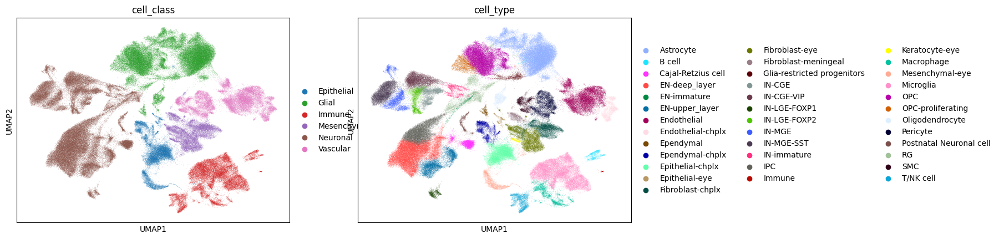

In [3]:
sc.pl.umap(adata, color=['cell_class', 'cell_type'])

### Subset Neuronal Cell Class

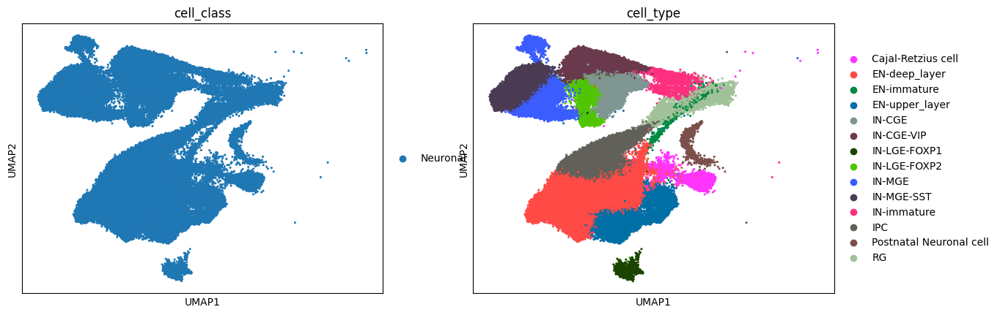

In [4]:
import scanpy as sc

# Subset the data
neuronal_adata = adata[adata.obs['cell_class'] == 'Neuronal'].copy()

# Define cell types you want to exclude
exclude_cell_types = [
    "OPC", 
    "Astrocyte", 
    "Ependymal-chplx", 
    "Glia-restricted progenitors"
]

# Filter out those cell types
neuronal_adata = neuronal_adata[~neuronal_adata.obs['cell_type'].isin(exclude_cell_types)].copy()
neuronal_adata.obs['cell_type'] = neuronal_adata.obs['cell_type'].cat.remove_unused_categories()

# Plot UMAP with the subset
sc.pl.umap(neuronal_adata, color=['cell_class', 'cell_type'], size=20)


/home/users/isakova/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_2823/485440656.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(neuronal_adata, resolution=2)


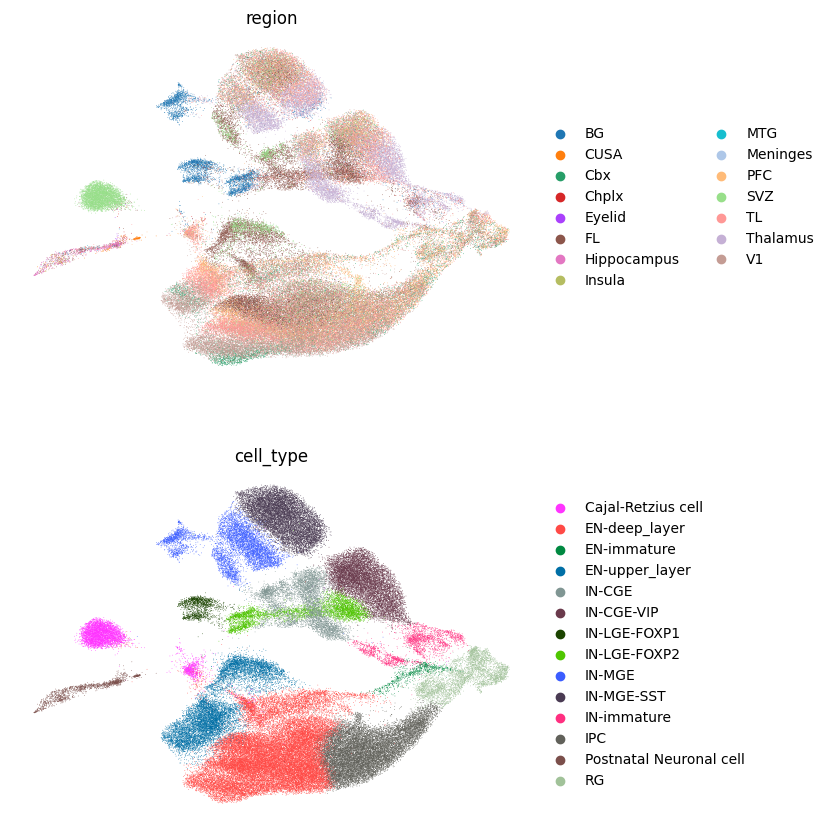

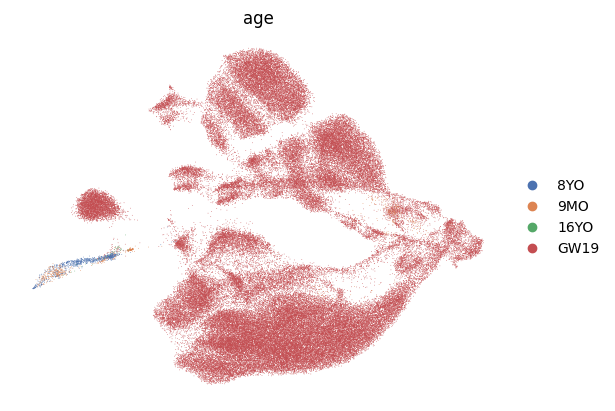

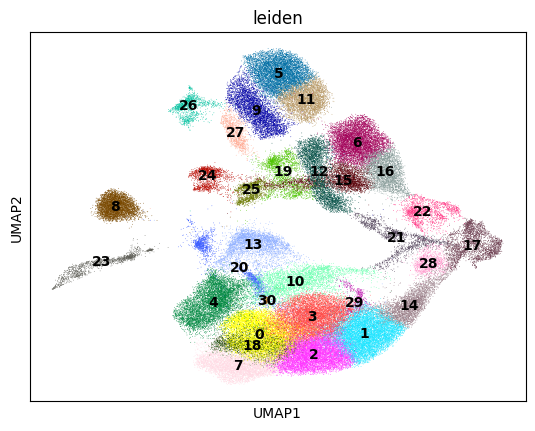

In [5]:
sc.pp.neighbors(neuronal_adata, use_rep="X_scVI")
sc.tl.umap(neuronal_adata)
sc.tl.leiden(neuronal_adata, resolution=2)

sc.pl.umap(
    neuronal_adata,
    color=["region", "cell_type"],
    frameon=False,
    ncols=1,
)
sc.pl.umap(
    neuronal_adata,
    color=["age"],
    frameon=False,
    ncols=1,
)

sc.pl.umap(neuronal_adata, color="leiden", legend_loc="on data")

In [6]:
neuronal_adata.write("TSB_Neuronal.h5ad")

In [2]:
neuronal_adata =sc.read("TSB_Neuronal.h5ad")

In [ ]:
# Canonical CR markers (well validated)
cr_markers = [
    "RELN",       # Classic
    "LHX1",       # Key TF for CR
    "LHX5",       # Also major, sometimes as LHX5-AS1
    "TTR",        # Marginal zone/CR, esp. human
    "EBF1", "EBF3",  # Early fate/CR
    "ZIC1", "ZIC2",  # Hem/CR, regional
    "NRP2",      # Guidance, often CR+ in development
    "SLC17A6",   # VGLUT2, glutamatergic CR cells
]

# Additional interesting genes from your list (often reported in MZ/CR in human scRNA-seq)
cr_candidates = [
    "RSPO3",     # Wnt modulator, marginal zone-enriched
    "CXCR4",     # Chemokine receptor, guides tangential migration
    "MAML3",     # Transcriptional cofactor, sometimes CR/MZ
    "DACH1",     # Developmental TF, some CR data
    "EMX2",      # CR precursor/hem, dorsal progenitors
    "PBX3",      # Transcription factor, some CR reports
    "NNAT",      # Developmental, sometimes MZ
    "PCBP3",
    "EMX1"      # Not classic, but shows up in some human data
]

# Combine for a full list
cr_gene_panel = cr_markers + cr_candidates
cr_gene_panel = [g for g in cr_gene_panel if g in adata.var_names]  # filter for genes present in your data

import scanpy as sc
sc.pl.dotplot(
    neuronal_adata, 
    cr_gene_panel, 
    groupby='cell_type',      # Or your cell type/cluster column
    standard_scale='var',  # Optional: scales each gene for visualization
    dendrogram=True
)


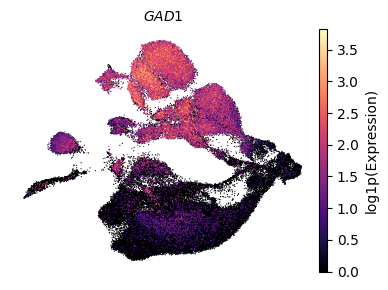

In [8]:
from matplotlib.colors import LinearSegmentedColormap

# Define a custom gray-to-red colormap
gray_red_cmap = LinearSegmentedColormap.from_list("gray_red", ["lightgray", "#a9373b"])

# Set figure size (width, height in inches); make it small and square
fig = sc.pl.umap(neuronal_adata, color=['GAD1'], wspace=0.5,
    size=3, show=False, frameon=False,
    layer=None,cmap='magma')

fig = plt.gcf()
fig.set_size_inches(4, 3)  # e.g., width=4, height=4 for square
# Make UMAP panel titles (gene names) italic
for ax in fig.axes:
    title = ax.get_title()
    if title:  # Only modify if title exists
        ax.set_title(r"$\mathit{{{}}}$".format(title), fontsize=10)

for ax in fig.axes:
    if hasattr(ax, 'get_ylabel') and 'color' in ax.get_label().lower():
        ax.set_ylabel("log1p(Expression)", fontsize=10)
    # OR label any axis with a visible colorbar
    if ax.get_position().x0 > 0.85:  # Usually the colorbar is to the far right
        ax.set_ylabel("log1p(Expression)", fontsize=10)

#plt.suptitle("sfRNA Load (sfRNA1-4)", fontsize=12)
plt.tight_layout()
#plt.savefig("umap_ex_marker.pdf", format='pdf', bbox_inches='tight')
plt.savefig("umap_ex_marker_GAD1.png", dpi=300, bbox_inches='tight')
#plt.savefig("umap_ex_marker_v2.pdf", bbox_inches='tight')
plt.show()

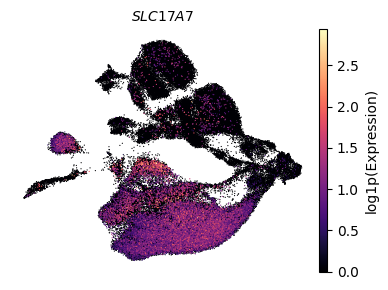

In [9]:
from matplotlib.colors import LinearSegmentedColormap

# Define a custom gray-to-red colormap
gray_red_cmap = LinearSegmentedColormap.from_list("gray_red", ["lightgray", "#a9373b"])

# Set figure size (width, height in inches); make it small and square
fig = sc.pl.umap(neuronal_adata, color=['SLC17A7'], wspace=0.5,
    size=3, show=False, frameon=False,
    layer=None,cmap='magma')

fig = plt.gcf()
fig.set_size_inches(4, 3)  # e.g., width=4, height=4 for square
# Make UMAP panel titles (gene names) italic
for ax in fig.axes:
    title = ax.get_title()
    if title:  # Only modify if title exists
        ax.set_title(r"$\mathit{{{}}}$".format(title), fontsize=10)

for ax in fig.axes:
    if hasattr(ax, 'get_ylabel') and 'color' in ax.get_label().lower():
        ax.set_ylabel("log1p(Expression)", fontsize=10)
    # OR label any axis with a visible colorbar
    if ax.get_position().x0 > 0.85:  # Usually the colorbar is to the far right
        ax.set_ylabel("log1p(Expression)", fontsize=10)

#plt.suptitle("sfRNA Load (sfRNA1-4)", fontsize=12)
plt.tight_layout()
#plt.savefig("umap_ex_marker.pdf", format='pdf', bbox_inches='tight')
plt.savefig("umap_ex_marker_SLC17A7.png", dpi=300, bbox_inches='tight')
#plt.savefig("umap_ex_marker_v2.pdf", bbox_inches='tight')
plt.show()

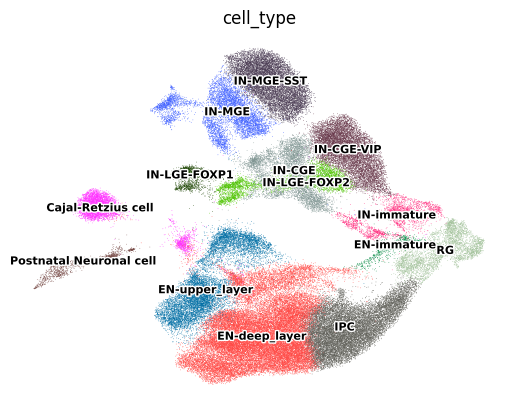

In [10]:
# Plot UMAP
sc.pl.umap(
    neuronal_adata,
    color=["cell_type"],
    legend_loc="on data",
    size=1,
    ncols=1,
    frameon=False,
    legend_fontsize=8,
    legend_fontoutline=2,
    save="Neuronal_umap.pdf"  # Optional
)

/tmp/ipykernel_2823/1072589413.py:30: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  region_props = region_counts.pivot_table(index='cell_type', columns='region_renamed', values='count', fill_value=0)


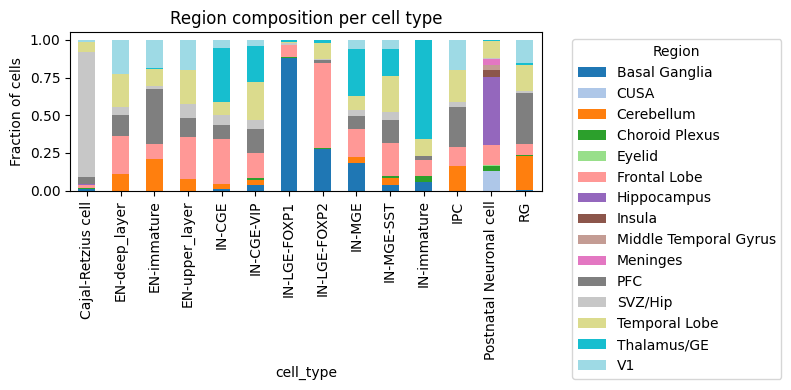

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Copy relevant metadata
df = neuronal_adata.obs[['cell_type', 'region']].copy()

# Step 2: Apply region renaming
region_map = {
    'BG': 'Basal Ganglia',
    'Cbx': 'Cerebellum',
    'Chplx': 'Choroid Plexus',
    'Eyelid': 'Eyelid',
    'FL': 'Frontal Lobe',
    'PFC': 'PFC',
    'SVZ': 'SVZ/Hip',
    'TL': 'Temporal Lobe',
    'Thalamus': 'Thalamus/GE',
    'V1': 'V1',
    'Hippocampus': 'Hippocampus',
    'Insula': 'Insula',
    'Meninges': 'Meninges',
    'CUSA': 'CUSA',
    'MTG': 'Middle Temporal Gyrus'
}
df['region_renamed'] = df['region'].map(region_map)

# Step 3: Count and normalize
region_counts = df.value_counts(['cell_type', 'region_renamed']).reset_index(name='count')
region_props = region_counts.pivot_table(index='cell_type', columns='region_renamed', values='count', fill_value=0)
region_props = region_props.div(region_props.sum(axis=1), axis=0)

# Step 4: Plot
region_props.plot(kind='bar', stacked=True, colormap='tab20', figsize=(8, 4))
plt.ylabel("Fraction of cells")
plt.title("Region composition per cell type")
plt.xticks(rotation=90)
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("neuronal_cell_fraction_by_region.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [12]:
neuronal_adata.write("TSB_Neuronal.h5ad")

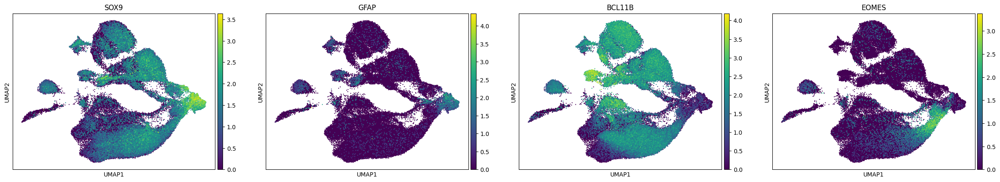

In [13]:
sc.pl.umap(neuronal_adata, color=["SOX9","GFAP", "BCL11B", "EOMES"], size=10, legend_loc="on data")

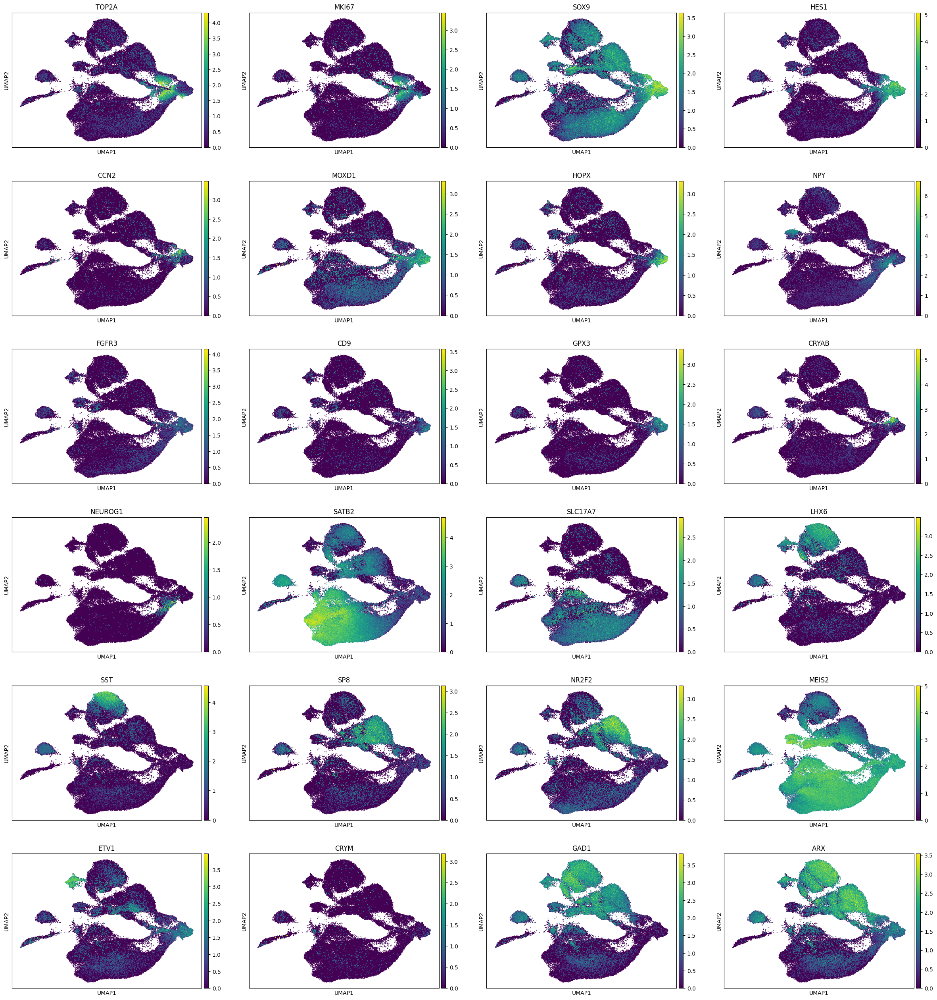

In [14]:
sc.pl.umap(neuronal_adata, color=["TOP2A","MKI67","SOX9", "HES1", "CCN2","MOXD1", "HOPX", "NPY", "FGFR3", "CD9", "GPX3", "CRYAB", 
"NEUROG1", "SATB2","SLC17A7","LHX6", "SST","SP8", "NR2F2","MEIS2", "ETV1", "CRYM", "GAD1", "ARX"], size=10, legend_loc="on data")

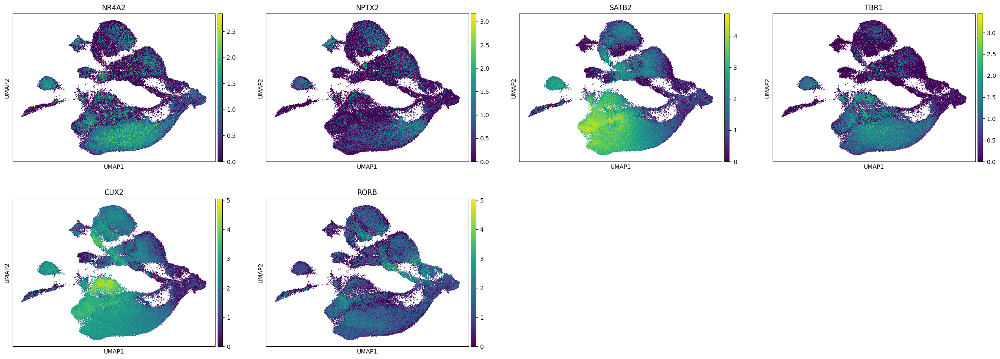

In [15]:
sc.pl.umap(
    neuronal_adata,
    color=[
         "NR4A2", "NPTX2", # "ST18", # SP
         "SATB2", "TBR1",      # Deep
        "CUX2", "RORB"         # Upper
    ],
    ncols=4,
    size=10,
)

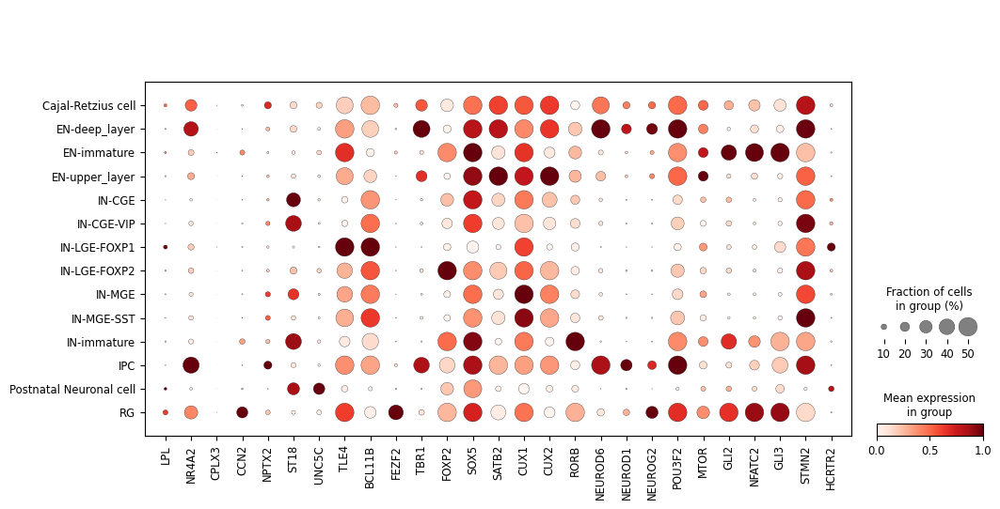

In [16]:
sp_markers = ["LPL", "NR4A2", "CPLX3", "CCN2", "NPTX2", "ST18", "UNC5C", "TLE4"]
deep_layer_markers = ["BCL11B", "FEZF2", "TBR1", "FOXP2", "SOX5"]
upper_layer_markers = ["SATB2", "CUX1", "CUX2", "RORB", "NEUROD6","NEUROD1","NEUROG2", "POU3F2", "MTOR", "GLI2", "NFATC2", "GLI3", "STMN2", "HCRTR2"]

all_markers = sp_markers + deep_layer_markers + upper_layer_markers
sc.pl.dotplot(
    neuronal_adata,
    var_names=all_markers,
    groupby='cell_type',  # or 'cell_type'
    standard_scale='var',  # normalize across genes
    dot_max=0.5,         # optional for clearer scalin     # optional: show cluster relationships
)



### Calculate PAGA and define lineages

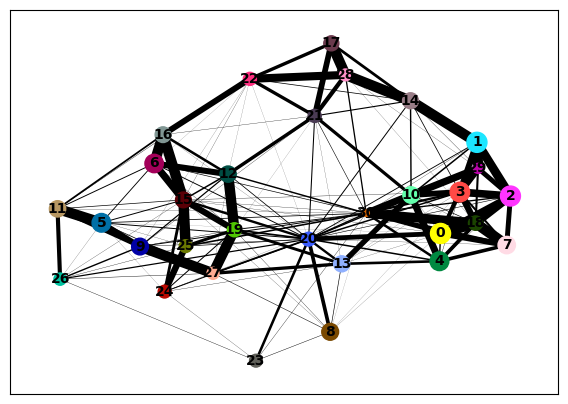

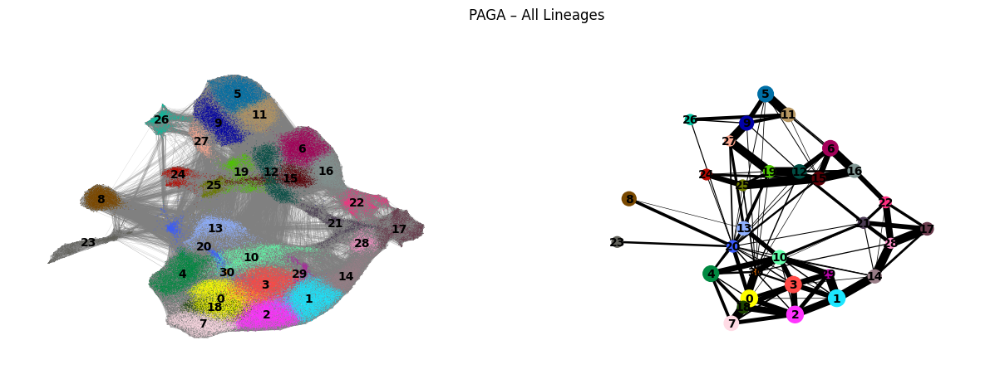

In [17]:
sc.tl.paga(neuronal_adata, groups="leiden")
sc.pl.paga(neuronal_adata, color=["leiden"])
# Visualize on UMAP
sc.pl.paga_compare(
    neuronal_adata,
    basis='umap',
    edges=True,
    title='PAGA – All Lineages',
    threshold=0.05
)

import numpy as np
neuronal_adata.uns["iroot"] = np.flatnonzero(neuronal_adata.obs["leiden"] == "18")[0]

#sc.tl.diffmap(neuronal_adata, n_comps=20)
#sc.tl.dpt(neuronal_adata,n_dcs=20)
#sc.pl.umap(neuronal_adata, color=["leiden", "dpt_pseudotime"], legend_loc="on data")

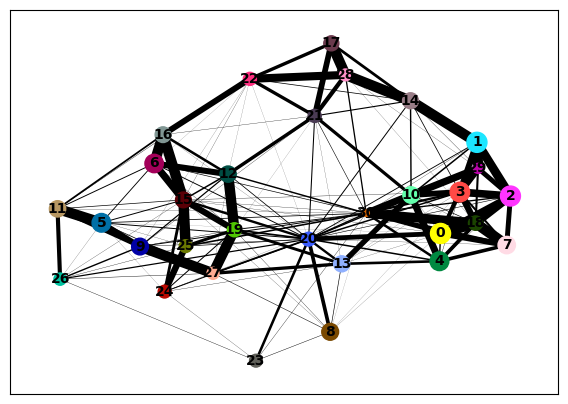

In [9]:
sc.pl.paga(neuronal_adata, color=["leiden"])


### Assign lineages and plot pseurodtime by lineage

In [10]:
paths = [
    ("Excitatory", [17, 28, 14,29,1,2,3,10,0,7,18,4,30,10,13]),
    ("Inhibitory", [17, 21,22,15,16,12,6,19,25,24,27,9,5,11,26 ]),
    #("Cajal-Retzius", [12, 22]),
]


/home/users/isakova/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


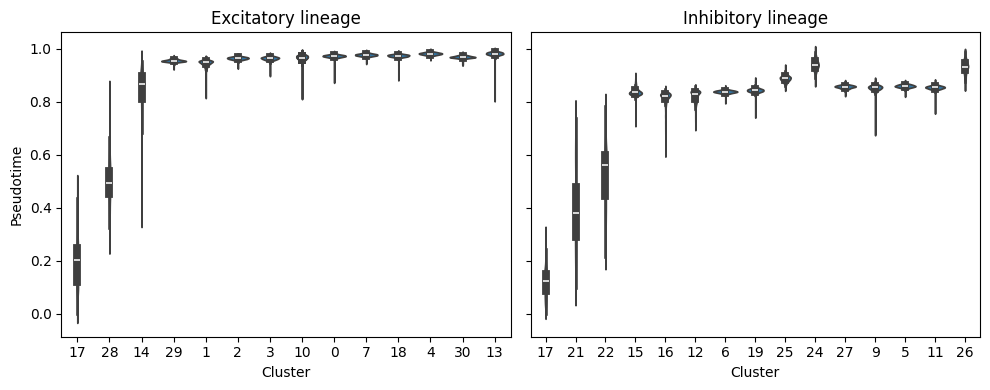

In [11]:
lineage_pseudotime = {}

for descr, path in paths:
    start_node = str(path[0])  # clusters as strings if using 'leiden'
    path_clusters = list(map(str, path))
    cells = neuronal_adata.obs['leiden'].isin(path_clusters)
    adata_path = neuronal_adata[cells].copy()
    
    # Required preprocessing
    sc.pp.neighbors(adata_path, use_rep='X_scVI')  # or your preferred embedding
    sc.tl.diffmap(adata_path)
    # pick a root cell index from the start_node cluster
    # Set the correct root cell
    root_cell_name = adata_path.obs[adata_path.obs['leiden'] == start_node].index[0]
    root_cell_idx = adata_path.obs_names.get_loc(root_cell_name)
    adata_path.uns['iroot'] = root_cell_idx
    sc.tl.dpt(adata_path)

    adata_path.obs['lineage'] = descr
    lineage_pseudotime[descr] = adata_path

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

fig, axs = plt.subplots(ncols=len(lineage_pseudotime), figsize=(5 * len(lineage_pseudotime), 4), sharey=True)

for ax, (descr, adata) in zip(axs, lineage_pseudotime.items()):
    df = pd.DataFrame({
        'pseudotime': adata.obs['dpt_pseudotime'],
        'cluster': adata.obs['leiden'],
    })

    # Sort cluster order by path, if needed
    cluster_order = list(map(str, paths[[p[0] for p in paths].index(descr)][1]))

    sns.violinplot(data=df, x='cluster', y='pseudotime', order=cluster_order, ax=ax)
    ax.set_title(f"{descr} lineage")
    ax.set_xlabel("Cluster")
    ax.set_ylabel("Pseudotime")

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Reset combined object from the full neuronal_adata
combined = neuronal_adata.copy()

# Create empty pseudotime columns
for descr in lineage_pseudotime:
    combined.obs[f'pseudotime_{descr}'] = np.nan
    combined.obs.loc[lineage_pseudotime[descr].obs_names, f'pseudotime_{descr}'] = \
        lineage_pseudotime[descr].obs['dpt_pseudotime']

# UMAP coordinates
umap_coords = combined.obsm['X_umap']

# Define colormaps for each lineage
color_map_dict = {  
    "Excitatory": "Reds",
    "Inhibitory": "Blues",
    #"Cajal-Retzius": "managua",
}

fig, ax = plt.subplots(figsize=(16, 3))

scatters = []
for descr in reversed(paths):
    lineage_name = descr[0]
    colname = f"pseudotime_{lineage_name}"
    if colname not in combined.obs:
        continue
    mask = ~combined.obs[colname].isna()
    pseudotime_values = combined.obs[colname][mask]
    scatter = ax.scatter(
        umap_coords[mask, 0],
        umap_coords[mask, 1],
        c=pseudotime_values,
        cmap=color_map_dict.get(lineage_name, 'viridis'),
        s=0.3,
        label=lineage_name
    )
    scatters.append((scatter, lineage_name))

# Final formatting
#ax.set_title("Lineage-specific pseudotime on shared UMAP")
ax.axis('off')
#ax.legend(loc='upper right', markerscale=2)

# Optional: Add a colorbar for each (can get crowded though)
for i, (scat, name) in enumerate(scatters):
    cbar = plt.colorbar(scat, ax=ax, fraction=0.03) #, pad=0.01 + 0.05 * i)
    cbar.set_label(f'{name} pseudotime', rotation=270, labelpad=15)

# Add uniformly sized colorbars using make_axes_locatable
#divider = make_axes_locatable(ax)
#for i, (scat, name) in enumerate(scatters):
#    cax = divider.append_axes("right", size="2%", pad=0.4 + i * 0.4)
#    cbar = plt.colorbar(scat, cax=cax)
#    cbar.set_label(f'{name}', rotation=270, labelpad=15)
#    cbar.ax.tick_params(labelsize=6)


plt.tight_layout()
#plt.savefig("lineage_pseudotime_umap2.png", dpi=300, bbox_inches='tight')
plt.savefig("lineages_with_pseudotime_umap2.pdf",bbox_inches='tight')

#plt.savefig("lineage_pseudotime_umap2.pdf")
plt.show()


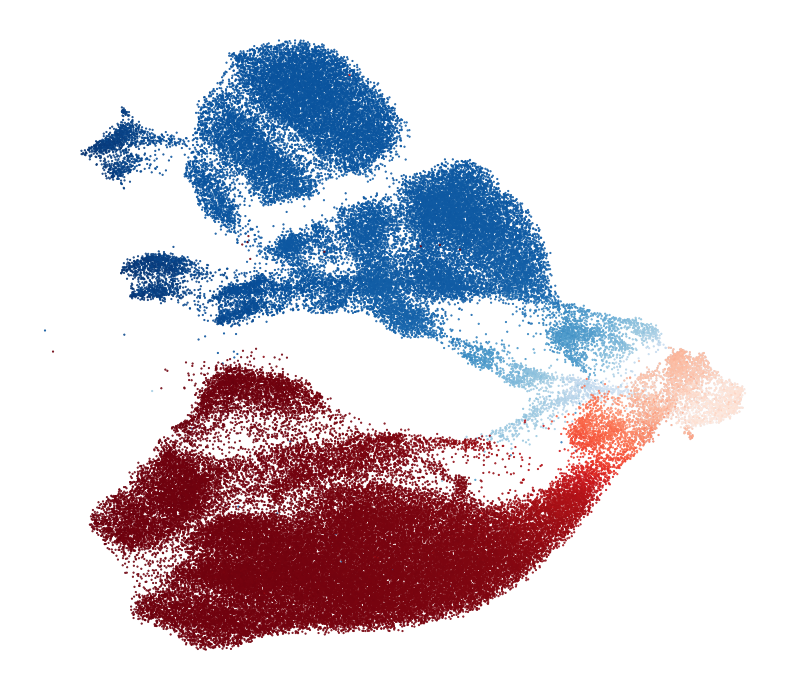

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Reset combined object from the full neuronal_adata
combined = neuronal_adata.copy()

# Create empty pseudotime columns
for descr in lineage_pseudotime:
    combined.obs[f'pseudotime_{descr}'] = np.nan
    combined.obs.loc[lineage_pseudotime[descr].obs_names, f'pseudotime_{descr}'] = \
        lineage_pseudotime[descr].obs['dpt_pseudotime']

# UMAP coordinates
umap_coords = combined.obsm['X_umap']


fig, ax = plt.subplots(figsize=(8, 7))

scatters = []
for descr in reversed(paths):
    lineage_name = descr[0]
    colname = f"pseudotime_{lineage_name}"
    if colname not in combined.obs:
        continue
    mask = ~combined.obs[colname].isna()
    pseudotime_values = combined.obs[colname][mask]
    scatter = ax.scatter(
        umap_coords[mask, 0],
        umap_coords[mask, 1],
        c=pseudotime_values,
        cmap=color_map_dict.get(lineage_name, 'viridis'),
        s=0.3,
        label=lineage_name
    )
    scatters.append((scatter, lineage_name))

# Final formatting
#ax.set_title("Lineage-specific pseudotime on shared UMAP")
ax.axis('off')
#ax.legend(loc='upper right', markerscale=2)

# Optional: Add a colorbar for each (can get crowded though)
#for i, (scat, name) in enumerate(scatters):
#    cbar = plt.colorbar(scat, ax=ax, fraction=0.03) #, pad=0.01 + 0.05 * i)
#    cbar.set_label(f'{name} pseudotime', rotation=270, labelpad=15)

# Add uniformly sized colorbars using make_axes_locatable
#divider = make_axes_locatable(ax)
#for i, (scat, name) in enumerate(scatters):
#    cax = divider.append_axes("right", size="2%", pad=0.4 + i * 0.4)
#    cbar = plt.colorbar(scat, cax=cax)
#    cbar.set_label(f'{name}', rotation=270, labelpad=15)
#    cbar.ax.tick_params(labelsize=6)


plt.tight_layout()
plt.savefig("lineage_pseudotime_umap2.png", dpi=300, bbox_inches='tight')
#plt.savefig("lineages_with_pseudotime_umap2.pdf",bbox_inches='tight')

#plt.savefig("lineage_pseudotime_umap2.pdf")
plt.show()


In [36]:
neuronal_adata.write("TSB_Neuronal.h5ad")

### Annotate adata with lineage

In [14]:
# Step 1: Convert paths list to a cluster → lineage dictionary
cluster_to_lineage = {}

for lineage_name, cluster_list in paths:
    for cluster in cluster_list:
        cluster_to_lineage[str(cluster)] = lineage_name  # Ensure cluster labels are strings

# Step 2: Create a new 'lineage' column in obs
neuronal_adata.obs['lineage'] = neuronal_adata.obs['leiden'].map(cluster_to_lineage)

# Step 3: Inspect unique lineage assignments
print(neuronal_adata.obs['lineage'].value_counts(dropna=False))


lineage
Excitatory    58272
Inhibitory    42769
NaN            7464
Name: count, dtype: int64

#### Add individual pseudotime to adata

In [15]:
import numpy as np

# Initialize the column with NaN
neuronal_adata.obs['individual_pseudotime'] = np.nan

# Fill in pseudotime values for each lineage subset
for descr, adata_sub in lineage_pseudotime.items():
    neuronal_adata.obs.loc[adata_sub.obs_names, 'individual_pseudotime'] = adata_sub.obs['dpt_pseudotime']


In [16]:
import scanpy as sc
# Create the plot
sc.pl.umap(
    neuronal_adata,
    color=['lineage'],
    frameon=False,         # removes the frame
    show=False             # don't show immediately (to allow further customization or saving)
)

# Save to file
plt.savefig("umap_lineage.png", dpi=300, bbox_inches='tight')
plt.savefig("umap_lineage.pdf", bbox_inches='tight')
plt.close()

# Create the plot
sc.pl.umap(
    neuronal_adata,
    color=['individual_pseudotime'],
    frameon=False,         # removes the frame
    show=False             # don't show immediately (to allow further customization or saving)
)

# Save to file
plt.savefig("umap_pseudotime_lineage.png", dpi=300, bbox_inches='tight')
plt.savefig("umap_pseudotime_lineage.pdf", bbox_inches='tight')
plt.close()


### Now extract DEGs and plot them as heatmap

### Assemble a gene list for the figure:

/tmp/ipykernel_17898/3066616393.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


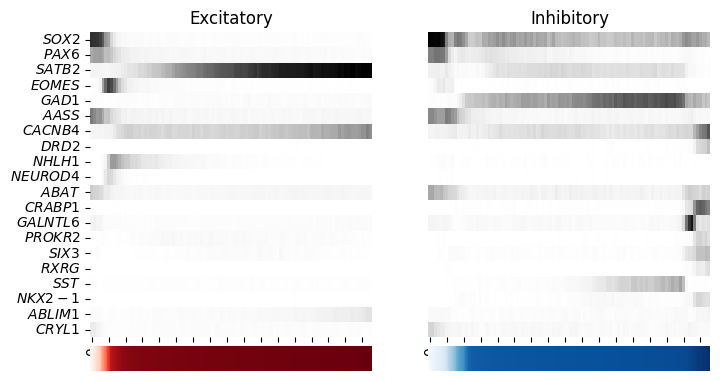

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
top_genes = [
    'SOX2', 'PAX6','SATB2','EOMES', 'GAD1', 'AASS','CACNB4', 'DRD2', 'NHLH1', 'NEUROD4', 'ABAT', 'CRABP1', 'GALNTL6', 'PROKR2', 'ABAT','SIX3', 'RXRG', 'SST', 
    'NKX2-1', 'ABLIM1',  'CRYL1',
    'NEUROD4', 'NHLH1', 'SATB2', 'GAD1','DRD2', 'CRABP1', 'ABAT',  'AASS', 'CACNB4',
    #'SFTA3', 'ENSG00000289862','ENSG00000286390', 'ENSG00000226097', 'ENSG00000260848', 'ENSG00000229976', 'RYR3-DT', 'LINC01568', 'LINC02955', 'LINC01884', 'LINC00944', 'LINC00391','AMZ2P1',
    #'MIR128-2', 'MIR222', 'MIR23A', 'MIR103A1', 'MIR663A', 'MIR92B', 'MIRLET7B','MIR27A', 'MIR125B1', 'MIR99A',
    #'SNORD3B-2',  'SNORA58', 'SNORA59B','SNORD35A', 'SNORA80E', 'SNORA53', 'SNORD13', 'SNORA3A', 'U6-8', 'RNU5A-1', 'RNU5E-4P', 'RNVU1-15','U3','SCARNA10', 'SCARNA2' #'SNORD118',
]


# Ensure uniqueness and preserve order
top_genes = list(dict.fromkeys(top_genes))


# Parameters
n_bins = 100


# Set up figure and layout
fig = plt.figure(figsize=(4 * len(paths), 4.4))
gs = gridspec.GridSpec(2, len(paths), height_ratios=[12, 1], hspace=0.05)

for ipath, (descr, path) in enumerate(paths):
    adata = lineage_pseudotime[descr]
    pseudotime = adata.obs['dpt_pseudotime'].copy()

    # 1. Z-score expression across all cells for selected genes
    raw_expr = adata[:, top_genes].to_df()
    df_expr = (raw_expr - raw_expr.min(axis=0)) / (raw_expr.max(axis=0) - raw_expr.min(axis=0))


    # 2. Assign pseudotime bins
    bins = pd.qcut(pseudotime, q=n_bins, labels=False)
    df_expr['pseudotime_bin'] = bins

    # 3. Compute average expression per bin
    binned = df_expr.groupby('pseudotime_bin')[top_genes].mean().T

    # 4. Main heatmap
    ax_heat = fig.add_subplot(gs[0, ipath])
    sns.heatmap(
        binned,
        cmap='Greys',
        cbar=False,
        ax=ax_heat,
        yticklabels=(ipath == 0)
    )
    ax_heat.set_title(f'{descr}')
    ax_heat.set_xlabel('')
    
    if ipath == 0:
        italic_labels = [r"$\mathit{{{}}}$".format(gene) for gene in binned.index]
        ax_heat.set_yticklabels(italic_labels, rotation=0)
    else:
        ax_heat.set_ylabel('')
        ax_heat.set_yticklabels([])


    # 5. Pseudotime color bar
    ax_bar = fig.add_subplot(gs[1, ipath])
    try:
        bin_df = pd.DataFrame({'pseudotime': pseudotime, 'bin': bins})
        avg_pseudotime = bin_df.groupby('bin')['pseudotime'].mean()
        norm_pseudo = (avg_pseudotime - avg_pseudotime.min()) / (avg_pseudotime.max() - avg_pseudotime.min())
        norm_pseudo = norm_pseudo.values[np.newaxis, :]  # shape (1, n_bins)

        cmap_name = color_map_dict.get(descr, 'viridis')
        rgba = plt.colormaps[cmap_name](norm_pseudo)

        ax_bar.imshow(rgba, aspect='auto')
        ax_bar.set_axis_off()

    except Exception as e:
        print(f"Could not add pseudotime bar for {descr}: {e}")
        ax_bar.set_axis_off()

plt.tight_layout()
plt.savefig("genes_changing_with_lineages_protein_coding.pdf",bbox_inches='tight')
plt.show()


/tmp/ipykernel_2823/3167258332.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


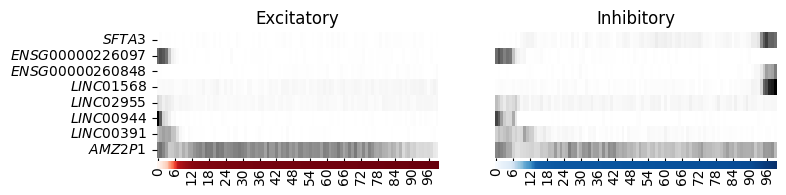

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
top_genes = [
    #'SATB2','EOMES', 'GAD1', 'MIR137', 'AASS','CACNB4', 'DRD2', 'NHLH1', 'NEUROD4', 'PROKR2','ABAT', 'CRABP1', 'GALNTL6', 'PROKR2', 'ABAT','SIX3','AACS', 'RXRG', 'SST', 
    #'NKX2-1', 'ABLIM1', 'TRAF7', 'CDK5', 'TRAF7','CRYL1',
    #'NEUROD4', 'NHLH1', 'SATB2', 'GAD1', 'MIR137', 'PROKR2','DRD2', 'CRABP1', 'ABAT',  'AASS', 'CACNB4',
    'SFTA3', 'ENSG00000226097', 'ENSG00000260848',  'LINC01568', 'LINC02955',  'LINC00944', 'LINC00391','AMZ2P1',
    #'MIR128-2', 'MIR222', 'MIR23A', 'MIR103A1', 'MIR663A', 'MIR92B', 'MIRLET7B','MIR27A', 'MIR125B1', 'MIR99A',
    #'SNORD3B-2',  'SNORA58', 'SNORA59B','SNORD35A', 'SNORA80E', 'SNORA53', 'SNORD13', 'SNORA3A', 'U6-8', 'RNU5A-1', 'RNU5E-4P', 'RNVU1-15','U3','SCARNA10', 'SCARNA2' #'SNORD118',
]


# Ensure uniqueness and preserve order
top_genes = list(dict.fromkeys(top_genes))


# Parameters
n_bins = 100

# Custom colormaps for pseudotime bars

# Set up figure and layout
fig = plt.figure(figsize=(4 * len(paths), 1.78))
gs = gridspec.GridSpec(2, len(paths), height_ratios=[15, 1], hspace=0.05)

for ipath, (descr, path) in enumerate(paths):
    adata = lineage_pseudotime[descr]
    pseudotime = adata.obs['dpt_pseudotime'].copy()

    # 1. Z-score expression across all cells for selected genes
    raw_expr = adata[:, top_genes].to_df()
    df_expr = (raw_expr - raw_expr.min(axis=0)) / (raw_expr.max(axis=0) - raw_expr.min(axis=0))


    # 2. Assign pseudotime bins
    bins = pd.qcut(pseudotime, q=n_bins, labels=False)
    df_expr['pseudotime_bin'] = bins

    # 3. Compute average expression per bin
    binned = df_expr.groupby('pseudotime_bin')[top_genes].mean().T

    # 4. Main heatmap
    ax_heat = fig.add_subplot(gs[0, ipath])
    sns.heatmap(
        binned,
        cmap='Greys',
        cbar=False,
        ax=ax_heat,
        yticklabels=(ipath == 0)
    )
    ax_heat.set_title(f'{descr}')
    ax_heat.set_xlabel('')
    
    if ipath == 0:
        italic_labels = [r"$\mathit{{{}}}$".format(gene) for gene in binned.index]
        ax_heat.set_yticklabels(italic_labels, rotation=0)
    else:
        ax_heat.set_ylabel('')
        ax_heat.set_yticklabels([])


    # 5. Pseudotime color bar
    ax_bar = fig.add_subplot(gs[1, ipath])
    try:
        bin_df = pd.DataFrame({'pseudotime': pseudotime, 'bin': bins})
        avg_pseudotime = bin_df.groupby('bin')['pseudotime'].mean()
        norm_pseudo = (avg_pseudotime - avg_pseudotime.min()) / (avg_pseudotime.max() - avg_pseudotime.min())
        norm_pseudo = norm_pseudo.values[np.newaxis, :]  # shape (1, n_bins)

        cmap_name = color_map_dict.get(descr, 'viridis')
        rgba = plt.colormaps[cmap_name](norm_pseudo)

        ax_bar.imshow(rgba, aspect='auto')
        ax_bar.set_axis_off()

    except Exception as e:
        print(f"Could not add pseudotime bar for {descr}: {e}")
        ax_bar.set_axis_off()

plt.tight_layout()
plt.savefig("genes_changing_with_lineages_lncRNA.pdf",bbox_inches='tight')
plt.show()


/tmp/ipykernel_2823/149733081.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


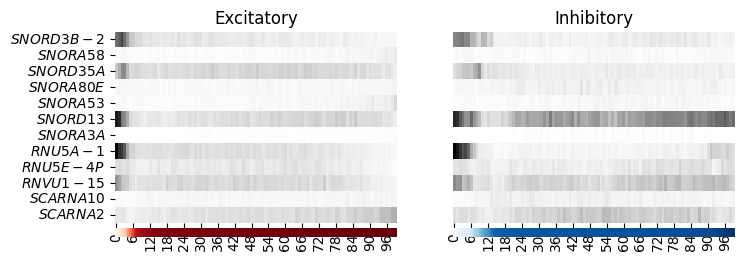

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
top_genes = [
    #'SATB2','EOMES', 'GAD1', 'MIR137', 'AASS','CACNB4', 'DRD2', 'NHLH1', 'NEUROD4', 'PROKR2','ABAT', 'CRABP1', 'GALNTL6', 'PROKR2', 'ABAT','SIX3','AACS', 'RXRG', 'SST', 
    #'NKX2-1', 'ABLIM1', 'TRAF7', 'CDK5', 'TRAF7','CRYL1',
    #'NEUROD4', 'NHLH1', 'SATB2', 'GAD1', 'MIR137', 'PROKR2','DRD2', 'CRABP1', 'ABAT',  'AASS', 'CACNB4',
    #'SFTA3', 'ENSG00000289862','ENSG00000286390', 'ENSG00000226097', 'ENSG00000260848', 'ENSG00000229976', 'RYR3-DT', 'LINC01568', 'LINC02955', 'LINC01884', 'LINC00944', 'LINC00391','AMZ2P1',
    'SNORD3B-2',  'SNORA58', 'SNORD35A', 'SNORA80E', 'SNORA53', 'SNORD13', 'SNORA3A', 'RNU5A-1', 'RNU5E-4P', 'RNVU1-15','SCARNA10', 'SCARNA2' #'SNORD118',
]


# Ensure uniqueness and preserve order
top_genes = list(dict.fromkeys(top_genes))


# Parameters
n_bins = 100



# Set up figure and layout
fig = plt.figure(figsize=(4 * len(paths), 2.67))
gs = gridspec.GridSpec(2, len(paths), height_ratios=[20, 1], hspace=0.05)

for ipath, (descr, path) in enumerate(paths):
    adata = lineage_pseudotime[descr]
    pseudotime = adata.obs['dpt_pseudotime'].copy()

    # 1. Z-score expression across all cells for selected genes
    raw_expr = adata[:, top_genes].to_df()
    df_expr = (raw_expr - raw_expr.min(axis=0)) / (raw_expr.max(axis=0) - raw_expr.min(axis=0))


    # 2. Assign pseudotime bins
    bins = pd.qcut(pseudotime, q=n_bins, labels=False)
    df_expr['pseudotime_bin'] = bins

    # 3. Compute average expression per bin
    binned = df_expr.groupby('pseudotime_bin')[top_genes].mean().T

    # 4. Main heatmap
    ax_heat = fig.add_subplot(gs[0, ipath])
    sns.heatmap(
        binned,
        cmap='Greys',
        cbar=False,
        ax=ax_heat,
        yticklabels=(ipath == 0)
    )
    ax_heat.set_title(f'{descr}')
    ax_heat.set_xlabel('')
    
    if ipath == 0:
        italic_labels = [r"$\mathit{{{}}}$".format(gene) for gene in binned.index]
        ax_heat.set_yticklabels(italic_labels, rotation=0)
    else:
        ax_heat.set_ylabel('')
        ax_heat.set_yticklabels([])


    # 5. Pseudotime color bar
    ax_bar = fig.add_subplot(gs[1, ipath])
    try:
        bin_df = pd.DataFrame({'pseudotime': pseudotime, 'bin': bins})
        avg_pseudotime = bin_df.groupby('bin')['pseudotime'].mean()
        norm_pseudo = (avg_pseudotime - avg_pseudotime.min()) / (avg_pseudotime.max() - avg_pseudotime.min())
        norm_pseudo = norm_pseudo.values[np.newaxis, :]  # shape (1, n_bins)

        cmap_name = color_map_dict.get(descr, 'viridis')
        rgba = plt.colormaps[cmap_name](norm_pseudo)

        ax_bar.imshow(rgba, aspect='auto')
        ax_bar.set_axis_off()

    except Exception as e:
        print(f"Could not add pseudotime bar for {descr}: {e}")
        ax_bar.set_axis_off()

plt.tight_layout()
plt.savefig("genes_changing_with_lineages_smallRNA.pdf",bbox_inches='tight')

plt.show()


/tmp/ipykernel_2823/1162106441.py:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


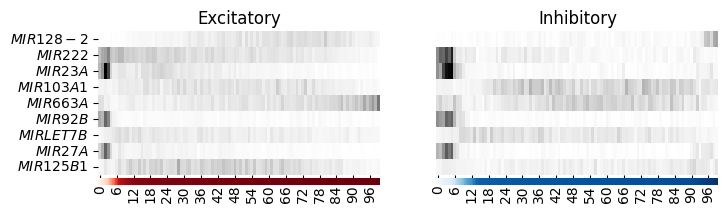

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
top_genes = [
    #'SATB2','EOMES', 'GAD1', 'MIR137', 'AASS','CACNB4', 'DRD2', 'NHLH1', 'NEUROD4', 'PROKR2','ABAT', 'CRABP1', 'GALNTL6', 'PROKR2', 'ABAT','SIX3','AACS', 'RXRG', 'SST', 
    #'NKX2-1', 'ABLIM1', 'TRAF7', 'CDK5', 'TRAF7','CRYL1',
    #'NEUROD4', 'NHLH1', 'SATB2', 'GAD1', 'MIR137', 'PROKR2','DRD2', 'CRABP1', 'ABAT',  'AASS', 'CACNB4',
    #'SFTA3', 'ENSG00000289862','ENSG00000286390', 'ENSG00000226097', 'ENSG00000260848', 'ENSG00000229976', 'RYR3-DT', 'LINC01568', 'LINC02955', 'LINC01884', 'LINC00944', 'LINC00391','AMZ2P1',
    'MIR128-2', 'MIR222', 'MIR23A', 'MIR103A1', 'MIR663A', 'MIR92B', 'MIRLET7B','MIR27A', 'MIR125B1', #'MIR99A',
]


# Ensure uniqueness and preserve order
top_genes = list(dict.fromkeys(top_genes))

# Parameters
n_bins = 100

# Set up figure and layout
fig = plt.figure(figsize=(4 * len(paths), 2))
gs = gridspec.GridSpec(2, len(paths), height_ratios=[20, 1], hspace=0.05)

for ipath, (descr, path) in enumerate(paths):
    adata = lineage_pseudotime[descr]
    pseudotime = adata.obs['dpt_pseudotime'].copy()

    # 1. Z-score expression across all cells for selected genes
    raw_expr = adata[:, top_genes].to_df()
    df_expr = (raw_expr - raw_expr.min(axis=0)) / (raw_expr.max(axis=0) - raw_expr.min(axis=0))


    # 2. Assign pseudotime bins
    bins = pd.qcut(pseudotime, q=n_bins, labels=False)
    df_expr['pseudotime_bin'] = bins

    # 3. Compute average expression per bin
    binned = df_expr.groupby('pseudotime_bin')[top_genes].mean().T

    # 4. Main heatmap
    ax_heat = fig.add_subplot(gs[0, ipath])
    sns.heatmap(
        binned,
        cmap='Greys',
        cbar=False,
        ax=ax_heat,
        yticklabels=(ipath == 0)
    )
    ax_heat.set_title(f'{descr}')
    ax_heat.set_xlabel('')
    
    if ipath == 0:
        italic_labels = [r"$\mathit{{{}}}$".format(gene) for gene in binned.index]
        ax_heat.set_yticklabels(italic_labels, rotation=0)
    else:
        ax_heat.set_ylabel('')
        ax_heat.set_yticklabels([])

    # 5. Pseudotime color bar
    ax_bar = fig.add_subplot(gs[1, ipath])
    try:
        bin_df = pd.DataFrame({'pseudotime': pseudotime, 'bin': bins})
        avg_pseudotime = bin_df.groupby('bin')['pseudotime'].mean()
        norm_pseudo = (avg_pseudotime - avg_pseudotime.min()) / (avg_pseudotime.max() - avg_pseudotime.min())
        norm_pseudo = norm_pseudo.values[np.newaxis, :]  # shape (1, n_bins)

        cmap_name = color_map_dict.get(descr, 'viridis')
        rgba = plt.colormaps[cmap_name](norm_pseudo)

        ax_bar.imshow(rgba, aspect='auto')
        ax_bar.set_axis_off()

    except Exception as e:
        print(f"Could not add pseudotime bar for {descr}: {e}")
        ax_bar.set_axis_off()

plt.tight_layout()
plt.savefig("genes_changing_with_lineages_miRNA.pdf",bbox_inches='tight')

plt.show()


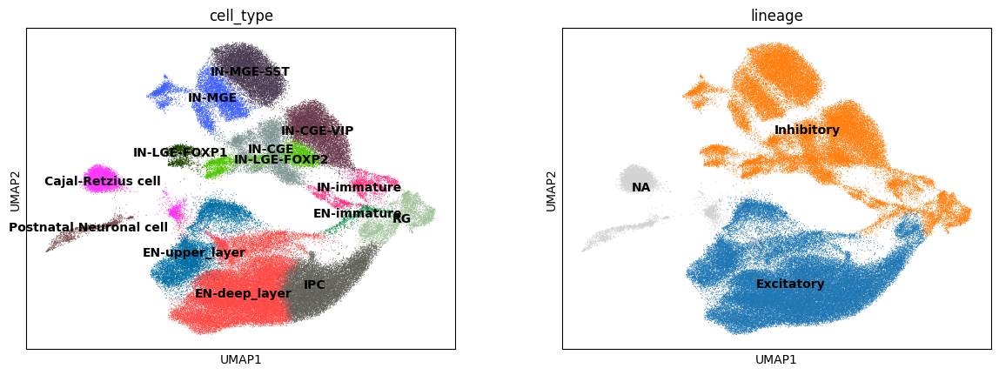

In [44]:
sc.pl.umap(neuronal_adata, color=["cell_type", "lineage"], legend_loc="on data",size=2)